<a href="https://colab.research.google.com/github/Murcha1990/ML_AI24/blob/main/Hometasks/Pro/AI_HW5_boosting_pro.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>


## **Домашняя работа 5: Бустинг и кластеризация**

### **Постановка задачи:**

В этой работы ваша задача подразделена на части:

*   В первой части вам предстоит реалищовать класс бустинга и сравнить его со встроенными классами популярных библиотек;
*   Во второй части вам предстоит применить алгоритмы кластеризации в задаче  разделения изображения на семантические компоненты;

### **Оценивание:**

- Как всегда оцениваются как код, так и ответы на вопросы. Если нет одного и/или другого, то часть баллов за соответствующее задание без колебаний снимается.
- Брать код из открытых источников позволительно. Следование культуре цитирования **обязательно.**

### **Баллы:**

Суммарно за задание можно получить 10 основных и 1 бонусный балл.

Оценка за ДЗ = min{ваш балл, 10}

**Мягкий дедлайн: 16 февраля 23:59**

**Интересной вам работы!**

## **Часть 1: построение класса алгоритма бустинга**

**Количество баллов:** 7

Начнём с нужных библиотек и загрузки данных. Работать будем с датасетом из Kaggle и с синтетическим датасетом.

Данные c Kaggle связаны с телефонной рекламой португальского банковского учреждения. Цель классификации — спрогнозировать, подпишется ли клиент на срочный депозит (переменная y).

Всего в данных 20 признаков, ознакомиться с признаковым описанием можно [здесь](https://www.kaggle.com/code/sachinrajput17/subscription-prediction-for-bank-marketing-data).

Будем действовать из предположений, что датасет достаточно хорош, чтобы мы уже могли построить на нём базовую модель.

In [245]:
import numpy as np
import pandas as pd
import plotly.express as px

from sklearn.tree import DecisionTreeClassifier, DecisionTreeRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, accuracy_score, f1_score, log_loss, roc_auc_score
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor, GradientBoostingClassifier
from warnings import filterwarnings
filterwarnings('ignore')

In [2]:
!wget  -O 'bank_data.csv' -q 'https://www.dropbox.com/s/uy27mctxo0gbuof/bank_data.csv?dl=0'

In [247]:
df = pd.read_csv('bank_data.csv')
df.sample(5)

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
8793,42,services,married,basic.9y,unknown,no,no,telephone,may,mon,...,5,999,0,nonexistent,1.1,93.994,-36.4,4.858,5191.0,-1
6454,51,blue-collar,married,basic.6y,unknown,yes,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,-1
8346,29,technician,single,professional.course,no,yes,no,telephone,oct,mon,...,1,999,0,nonexistent,-0.1,93.798,-40.4,4.912,5195.8,1
8836,32,technician,married,professional.course,no,no,no,cellular,apr,mon,...,2,999,0,nonexistent,-1.8,93.749,-34.6,0.645,5008.7,1
6552,41,admin.,divorced,university.degree,no,no,no,cellular,aug,tue,...,1,999,0,nonexistent,1.4,93.444,-36.1,4.963,5228.1,-1


Разделим на train и test (random_state не меняем)

In [250]:
df_train, df_test = train_test_split(df, test_size=0.2, random_state=42)

Генерируем синтетические данные (seed не меняем)

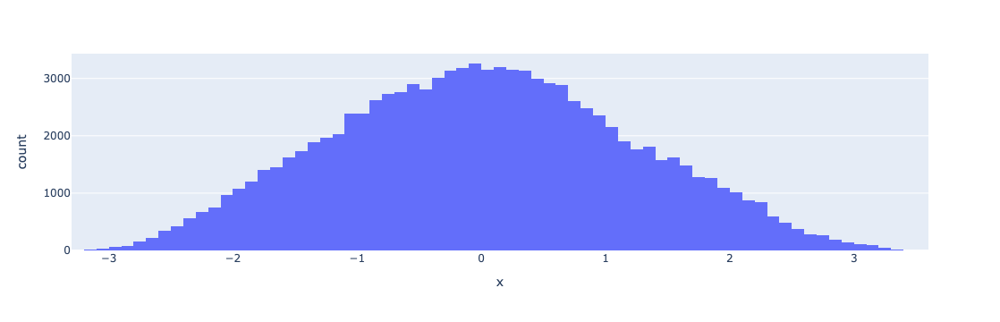

In [253]:
np.random.seed(42)

num_obs = 10 ** 5
num_thresholds = 50

X_synthetic = np.random.normal(scale=3, size=[num_obs, 2])
x1_thresholds = np.random.choice(X_synthetic[:, 0], num_thresholds, False)
x2_thresholds = np.random.choice(X_synthetic[:, 1], num_thresholds, False)

gains = np.random.uniform(-0.4086, 0.5, size=[2 * num_thresholds, 1])
x1_thresholds_cond = [X_synthetic[:, 0] >= threshold for threshold in x1_thresholds]
x2_thresholds_cond = [X_synthetic[:, 1] >= threshold for threshold in x2_thresholds]

noise = np.random.uniform(-0.5, 0.5, size=num_obs)

y_synthetic_probits = np.sum(
    gains[:num_thresholds] * x1_thresholds_cond + gains[num_thresholds:] * x2_thresholds_cond, axis=0
) + noise
y_synthetic = np.sign(y_synthetic_probits)

X_train_synthetic, y_train_synthetic = X_synthetic[:int(num_obs * 0.8)], y_synthetic[:int(num_obs * 0.8)]
X_test_synthetic, y_test_synthetic = X_synthetic[int(num_obs * 0.8):], y_synthetic[int(num_obs * 0.8):]

px.histogram(x = y_synthetic_probits, nbins=100)

Некоторый полезный код для визуализации предсказаний (пригодится позже)

In [256]:
import matplotlib.pyplot as plt

def plot_predicts(model, features, targets, x_lim=[-15.0, 15.0], y_lim=[-15.0, 15.0],
                  examples_density=0.01, steps=1000, num_ticks=6, title='', mode='classification'):
    '''
    Функция для визуализации предсказаний модели на двухмерной плоскости
    param model: обученная модель классификации или регрессии для двухмерных объектов
    param features: признаки выборки (a.k.a. X)
    param targets: целевая переменная выборки (a.k.a y)
    param x_lim: пределы для x
    param y_lim: пределы для y
    param examples_density: доля выборки, которая будет нарисована
    param steps: частота разбиения плоскости
    param num_ticks: число подписей на графике
    param title: заголовок графика
    param mode: режим 'classification' - вероятности положительного класса
                режим 'regression' - вещественная целевая переменная
    '''

    mask = np.random.choice([True, False], size=features.shape[0],
                            p=[examples_density, 1.0 - examples_density])
    features_x = (features[mask, 0] - x_lim[0]) / (x_lim[1] - x_lim[0]) * steps
    features_y = (features[mask, 1] - y_lim[0]) / (y_lim[1] - y_lim[0]) * steps

    xs = np.linspace(x_lim[0], x_lim[1], steps)
    ys = np.linspace(y_lim[0], y_lim[1], steps)

    xs, ys = np.meshgrid(xs, ys)
    grid = np.stack([xs.flatten(), ys.flatten()], axis=1)
    if mode == 'classification':
        predicts = model.predict_proba(grid)[:, 1].reshape(steps, steps)
        values = (targets[mask] == 1).astype(float)
    elif mode == 'regression':
        predicts = model.predict(grid).reshape(steps, steps)
        values = targets[mask]
    else:
        raise ValueError('Unknown mode')

    plt.figure(figsize=(10, 10))
    plt.imshow(predicts, origin='lower')
    plt.scatter(features_x, features_y, c=values, edgecolors='white', linewidths=1.5)
    plt.colorbar()

    plt.xticks(np.linspace(0, steps, num_ticks), np.linspace(x_lim[0], x_lim[1], num_ticks))
    plt.yticks(np.linspace(0, steps, num_ticks), np.linspace(y_lim[0], y_lim[1], num_ticks))
    plt.xlabel('x')
    plt.ylabel('y')
    plt.title(title)
    plt.grid()
    plt.show()

### **Задание 1. (4 балла) Реализуйте бустинг для задачи бинарной классификации**

Реализовывать класс буситнга необходимо согласно его теоретическому описанию. Вы начинаете с параметрами:

- `base_model_class=DecisionTreeRegressor` — базовая модель
- `base_model_params: dict={'max_features': 0.1}` — параметрмы базовой модели, рассчет максимального количества признаков полагаем как: `max(1, int(max_features * n_features_in_))`
- `n_estimators: int=10` — количество моделей
- `learning_rate: float=0.1` — скорость обучения
- `subsample: float=0.3` — доля данных, которая будет использоваться для подбора отдельных алгоритмов.
— `random_seed: int=228` — тут как всегда
– `custom_loss: list or tuple=None` — функция потерь
— `use_best_model: bool=False` — использовать ли при вызове predict и predict_proba лучшее с точки зрения валидационной выборки число деревьев в композиции
— `n_iter_early_stopping: int=None` — ранний критерий остановки

**Примечание:**

Поскольку градиентный бустинг обучается через последовательное создание моделей, может получиться так, что оптимальная с точки зрения генерализации модель будет получена на промежуточной итерации. Обычно для контроля такого поведения в методе `fit` передается также валидационная выборка, по которой можно оценивать общее качество модели в процессе обучения (желательно делать это каждую итерацию, но если ваша имплементация слишком медленная или ваше железо не тянет, можно делать это реже).

**Примечание 2:**

Нет смысла обучать действительно глубокую модель на 1000 деревьев и больше, если оптимальный ансамбль получился, к примеру, на 70 итерации и в течение какого-то количества итераций не улучшился - поэтому мы также задействуем early stopping при отсутствии улучшений в течение некоторого числа итераций.

In [266]:
class Boosting:
    def __init__(
        self,
        base_model_class=DecisionTreeRegressor,
        base_model_params: dict = {},
        n_estimators: int = 10,
        learning_rate: float = 0.1,
        subsample: float = 0.3,
        random_seed: int = 228,
        custom_loss: list or tuple = None,
        use_best_model: bool = False,
        n_iter_early_stopping: int = None
    ):
        """
        Градиентный бустинг для бинарной классификации (метки: -1 или +1).
        Сигмоида применяется к сумме прогнозов (логитов) всех базовых моделей.
        """

        # Класс базовой модели
        self.base_model_class = base_model_class
        # Параметры для инициализации базовой модели
        self.base_model_params = base_model_params
        # Число базовых моделей
        self.n_estimators = n_estimators
        # Длина шага (eta в классическом описании)
        self.learning_rate = learning_rate
        # Доля объектов, на которых обучается каждая модель (stochastic GB)
        self.subsample = subsample
        # seed для бутстрапа, если хотим воспроизводимость
        self.random_seed = random_seed
        # Использовать ли при predict/predict_proba лучшее число деревьев (по валидации)
        self.use_best_model = use_best_model
        # Ранний останов: число итераций без улучшения, после которых завершаем fit
        self.n_iter_early_stopping = n_iter_early_stopping

        # Место для "нулевой" модели (константа в пространстве логитов)
        self.initial_model_pred = None

        # Список для хранения оптимальных коэффициентов гамм
        self.gammas = []

        # Список базовых моделей
        self.models = [self.base_model_class(**self.base_model_params) for _ in range(self.n_estimators)]

        # Либо пользователь передаёт свою функцию потерь (loss, grad), либо используем логистическую:
        if custom_loss is not None:
            self.loss_fn, self.loss_derivative = custom_loss
        else:
            self.sigmoid = lambda z: 1 / (1 + np.exp(-z))
            # Логистическая функция потерь для y∈{-1,+1}: L = -log(sigmoid(y*z))
            self.loss_fn = lambda y, z: -np.log(self.sigmoid(y * z)).mean()
            # Производная L по z (dL/dz) = -y*sigmoid(-y*z). Но здесь будет храниться именно dL/dz,
            # поэтому псевдо-остаток (минус производная) = - (dL/dz) = y*sigmoid(-y*z).
            self.loss_derivative = lambda y, z: -y * self.sigmoid(-y * z)

        # Для сохранения лучшего числа деревьев (при use_best_model = True)
        self.best_n_estimators_ = n_estimators

    def _fit_initial_model(self, X, y):
        """
        Функция для построения нулевой (простой) модели. Не забудьте взять логарифм, потому что сигмоида применяется
        уже к сумме предсказаний базовых моделей, а не к каждому предсказанию каждой модели по отдельности.
        Подойдёт константная модель, возвращающая самый популярный класс,
        но если хотите, можете сделать что-нибудь посложнее.
        """
        pos_fraction = np.mean(y == 1)
        eps = 1e-9
        pos_fraction = np.clip(pos_fraction, eps, 1 - eps)

        self.initial_model_pred = np.log(pos_fraction / (1 - pos_fraction))

    def _fit_new_model(self, X: np.ndarray, y: np.ndarray or list, n_model: int):
        """
        Функция для обучения одной базовой модели бустинга
        :param X: матрица признаков
        :param y: вектор целевой переменной
        :param n_model: номер модели, которую хотим обучить
        """
        current_preds = self.current_preds_
        pseudo_residuals = - self.loss_derivative(y, current_preds)

        rng = np.random.default_rng(self.random_seed + n_model)
        n_samples = X.shape[0]
        sample_size = int(self.subsample * n_samples)

        if sample_size < n_samples:
            idx = rng.choice(n_samples, size=sample_size, replace=False)
            X_sub, r_sub = X[idx], pseudo_residuals[idx]
        else:
            X_sub, r_sub = X, pseudo_residuals

        model = self.models[n_model]
        model.fit(X_sub, r_sub)

        new_preds = model.predict(X)

        gamma = self._find_optimal_gamma(y, current_preds, new_preds)

        self.gammas.append(gamma)

        return model, gamma

    def _find_optimal_gamma(self, y: np.ndarray or list,
                            old_predictions: np.ndarray,
                            new_predictions: np.ndarray,
                            boundaries: tuple or list = (0.01, 1)):
        """
        Функция для поиска оптимального значения параметра gamma (коэффициент перед новой базовой моделью).
        :param y: вектор целевой переменной
        :param old_predictions: вектор суммы предсказаний предыдущих моделей (до сигмоиды)
        :param new_predictions: вектор суммы предсказаний новой модели (после сигмоиды)
        :param boudnaries: в каком диапазоне искать оптимальное значение ɣ (array-like объект из левой и правой границ)
        """
        # Определеяем начальные лосс и оптимальную гамму
        loss = self.loss_fn(y, old_predictions)
        optimal_gamma = 0.0
        # Множество, на котором будем искать оптимальное значение гаммы
        gammas = np.linspace(*boundaries, 100)
        # Простым перебором ищем оптимальное значение
        for gamma in gammas:
            pred = old_predictions + gamma * new_predictions
            cur_loss = self.loss_fn(y, pred)
            if cur_loss < loss:
                loss = cur_loss
                optimal_gamma = gamma

        return optimal_gamma

    def fit(self, X, y, eval_set=None):
        """
        Функция для обучения всей модели бустинга
        :param X: матрица признаков
        :param y: вектор целевой переменной
        :eval_set: кортеж (X_val, y_val) для контроля процесса обучения или None, если контроль не используется
        """
        self._fit_initial_model(X, y)

        self.current_preds_ = np.full(X.shape[0], self.initial_model_pred, dtype=float)

        if eval_set is not None:
            X_val, y_val = eval_set
            self.current_preds_val_ = np.full(X_val.shape[0], self.initial_model_pred, dtype=float)

            best_loss = self.loss_fn(y_val, self.current_preds_val_)
            no_improve_iters = 0
        else:
            best_loss = float('inf')
            no_improve_iters = 0

        for n_model in range(self.n_estimators):
            model, gamma_n = self._fit_new_model(X, y, n_model)
            new_preds = model.predict(X)
            self.current_preds_ += self.learning_rate * gamma_n * new_preds

            if eval_set is not None:
                new_preds_val = model.predict(X_val)
                self.current_preds_val_ += self.learning_rate * gamma_n * new_preds_val

                cur_val_loss = self.loss_fn(y_val, self.current_preds_val_)

                if cur_val_loss < best_loss:
                    best_loss = cur_val_loss
                    no_improve_iters = 0
                    self.best_n_estimators_ = n_model + 1
                else:
                    no_improve_iters += 1

                if self.n_iter_early_stopping is not None and no_improve_iters >= self.n_iter_early_stopping:
                    break

        return self

    def predict(self, X: np.ndarray):
        """
        Функция для предсказания классов обученной моделью бустинга
        :param X: матрица признаков
        """
        if self.use_best_model:
            n_estimators = self.best_n_estimators_
        else:
            n_estimators = self.n_estimators
            
        raw_score = np.full(X.shape[0], self.initial_model_pred, dtype=float)
        for i in range(n_estimators):
            raw_score += self.learning_rate * self.gammas[i] * self.models[i].predict(X)

        return np.where(raw_score >= 0, 1, -1)

    def predict_proba(self, X: np.ndarray):
        """
        Функция для предсказания вероятностей классов обученной моделью бустинга
        :param X: матрица признаков
        """
        if self.use_best_model:
            n_estimators = self.best_n_estimators_
        else:
            n_estimators = self.n_estimators
            
        n_trained = len(self.gammas) 
        n_estimators = min(n_estimators, n_trained, len(self.models))
    
        raw_score = np.full(X.shape[0], self.initial_model_pred, dtype=float)
    
        for i in range(n_estimators):
            raw_score += self.learning_rate * self.gammas[i] * self.models[i].predict(X)
    
        proba_pos = 1 / (1 + np.exp(-raw_score))
        proba_neg = 1 - proba_pos
        return np.column_stack([proba_neg, proba_pos])
    
    @property
    def feature_importances_(self):
        """
        Функция для вычисления важностей признаков.
        Вычисление должно проводиться после обучения модели
        и быть доступно атрибутом класса.
        """
        importances = np.zeros_like(self.models[0].feature_importances_, dtype=float)
        for model in self.models:
            importances += model.feature_importances_
        n_trained = len(self.gammas)
        if n_trained > 0:
            importances /= n_trained
        return importances

## **Тест для вашей имплементации.**

Если класс написан правильно, две следующие ячейки должна отработать без ошибок и относительно быстро (у автора задания 2 и 0.2 секунд соответственно, accuracy 0.911 и 0.879 соответственно). Если у вас получилось качество выше указанного — отлично!

In [262]:
%%time

boosting = Boosting(base_model_params={'max_features': 0.1})
boosting.fit(X_train_synthetic, y_train_synthetic)
# Без разницы, выдает эта строка классы или вероятности

preds = np.round(boosting.predict_proba(X_test_synthetic)[:, 1] > 0.5)

print(accuracy_score((y_test_synthetic == 1), preds))

0.9103
CPU times: user 1.13 s, sys: 142 ms, total: 1.27 s
Wall time: 1.27 s


In [264]:
%%time

boosting = Boosting(base_model_params={'max_features': 0.1})
boosting.fit(df_train.select_dtypes(['int64', 'float64']).drop(columns='y').values, df_train.y.values)
# Без разницы, выдает эта строка классы или вероятности
preds = np.round(boosting.predict(df_test.select_dtypes(['int64', 'float64']).drop(columns='y').values) > 0.5)
print(accuracy_score((df_test.y.values == 1), np.round(preds)))
print(accuracy_score((df_test.y.values == 1), np.round(preds)) > 0.87)

0.8825431034482759
True
CPU times: user 129 ms, sys: 5.95 ms, total: 135 ms
Wall time: 136 ms


### **Задание 2. (1.2 балла) Сравнение с базовыми моделями**

- Сравните результаты вашей имплементации бустинга, где в качестве базовых моделей используйте алгоритмы, перечисленные ниже. Сравнение проводите на обоих датасетах и ответьте на вопросы. Разумеется, надо измерять качество на тестовых данных. Данные берите из реальной задачи (bank_data).
- Ответьте на поставленные вопросы

Варианты для базовой модели (разумеется, не надо их программировать самостоятельно, берите нужные классы из sklearn):

- Решающее дерево глубины 6
- Случайный лес (число деревьев — на ваше усмотрение, только не слишком мало)
- Линейная регрессия

**Решающее дерево глубины 6**

In [206]:
%%time

dt_6_boosting = Boosting(base_model_class=DecisionTreeRegressor, base_model_params={'max_depth': 6})
dt_6_boosting.fit(df_train.select_dtypes(['int64', 'float64']).drop(columns='y').values, df_train.y.values)
preds_dt_6 = np.round(dt_6_boosting.predict(df_test.select_dtypes(['int64', 'float64']).drop(columns='y').values) > 0.5)

accuracy_score((df_test.y.values == 1), preds_dt_6)

CPU times: user 133 ms, sys: 2.78 ms, total: 136 ms
Wall time: 136 ms


0.8857758620689655

In [286]:
np.round(df_train.y.values == 1)

array([1., 1., 0., ..., 0., 0., 0.], dtype=float16)

**Случайный лес**

In [209]:
%%time

rf_boosting = Boosting(base_model_class=RandomForestRegressor, base_model_params={'n_estimators': 500})
rf_boosting.fit(df_train.select_dtypes(['int64', 'float64']).drop(columns='y').values, df_train.y.values)
preds_rf = np.round(rf_boosting.predict(df_test.select_dtypes(['int64', 'float64']).drop(columns='y').values) > 0.5)

accuracy_score((df_test.y.values == 1), preds_rf)

CPU times: user 30.9 s, sys: 383 ms, total: 31.3 s
Wall time: 31.3 s


0.8933189655172413

**Линейная регрессия**

In [138]:
from sklearn.linear_model import LinearRegression

In [210]:
reg_boosting = Boosting(base_model_class=LinearRegression)
reg_boosting.fit(df_train.select_dtypes(['int64', 'float64']).drop(columns='y').values, df_train.y.values)
preds_reg = np.round(reg_boosting.predict(df_test.select_dtypes(['int64', 'float64']).drop(columns='y').values) > 0.5)

accuracy_score((df_test.y.values == 1), preds_reg)

0.8324353448275862

**Вопросы:**

1) Какая из моделей имеет оптимальное качество? С чем это связано?

2) Какая из моделей сильнее переобучается? Есть ли преимущества от использования ранней остановки и обрезания бустинга до лучшей модели?

3) Работает ли бустинг над линейными регрессиями лучше, чем одна логистическая регрессия? Как объяснить этот результат?

4) Визуализируйте предсказания моделей только на синтетическом датасете (для этого можете воспользоваться вспомогательной функцией plot_predicts). Чем отличаются картинки, которые получаются у разных алгоритмов? Сделайте выводы.

**Какая из моделей имеет оптимальное качество? С чем это связано?**

**Ответ:** *Оптимальное качество показала модель `Random Forest`. Это связано с тем, что случайный лес использует ансамбль деревьев, что помогает снизить дисперсию и улучшить обобщающую способность модели. `*

**Какая из моделей сильнее переобучается? Есть ли преимущества от использования ранней остановки и обрезания бустинга до лучшей модели?**

In [217]:
preds_dt_6_train = np.round(dt_6_boosting.predict(df_train.select_dtypes(['int64', 'float64']).drop(columns='y').values) > 0.5)

accuracy_score((df_train.y.values == 1), preds_dt_6_train)

0.896551724137931

In [219]:
preds_rf_train = np.round(rf_boosting.predict(df_train.select_dtypes(['int64', 'float64']).drop(columns='y').values) > 0.5)

accuracy_score((df_train.y.values == 1), preds_rf_train)

0.9224137931034483

In [220]:
preds_reg_train = np.round(reg_boosting.predict(df_train.select_dtypes(['int64', 'float64']).drop(columns='y').values) > 0.5)

accuracy_score((df_train.y.values == 1), preds_reg_train)

0.8367456896551724

**Ответ:** *Сильнее всего переобучается бустинг с базовой моделью в виде случайного леса. Это происходит потому, что случайный лес уже является ансамблем, и его использование в бустинге может привести к чрезмерному запоминанию обучающих данных. В результате на обучающей выборке модель показывает очень высокую точность (0.922), но на тестовой выборке точность снижается (0.893), что указывает на переобучение.*

**Работает ли бустинг над линейными регрессиями лучше, чем одна логистическая регрессия? Как объяснить этот результат?**

Попробуем обучить логистическую регрессию на наших данных

In [224]:
from sklearn.linear_model import LogisticRegression

log_reg = LogisticRegression(max_iter=3000)

log_reg.fit(df_train.select_dtypes(['int64', 'float64']).drop(columns='y').values, df_train.y.values)
preds_lr = np.round(log_reg.predict(df_test.select_dtypes(['int64', 'float64']).drop(columns='y').values) > 0.5)
accuracy_score((df_test.y.values == 1), preds_lr)

0.8550646551724138

**Ответ:**  *Логистическая регрессия показала лучший результат, чем бустинг на линейной регрессии. Линейная регрессия в качестве базовой модели не может эффективно улавливать сложные зависимости, так как каждый новый шаг бустинга добавляет лишь еще одну линейную зависимость, что не дает значительного улучшения. Логистическая регрессия изначально лучше приспособлена к задаче классификации, так как использует сигмоидную функцию активации, позволяя эффективнее разделять классы. В результате ее точность оказалась выше, чем у бустинга с линейной регрессией.*

**Визуализируйте предсказания моделей только на синтетическом датасете (для этого можете воспользоваться вспомогательной функцией plot_predicts). Чем отличаются картинки, которые получаются у разных алгоритмов? Сделайте выводы**

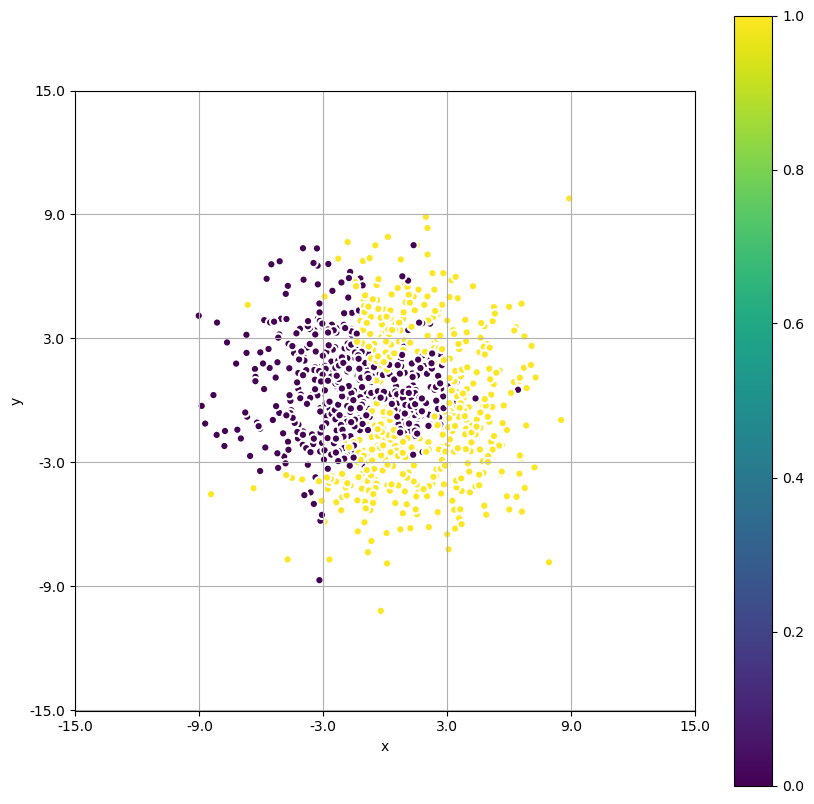

In [267]:
plot_predicts(model=Boosting(base_model_class=DecisionTreeRegressor, base_model_params={'max_depth': 6}), features=X_synthetic,
             targets=y_synthetic)

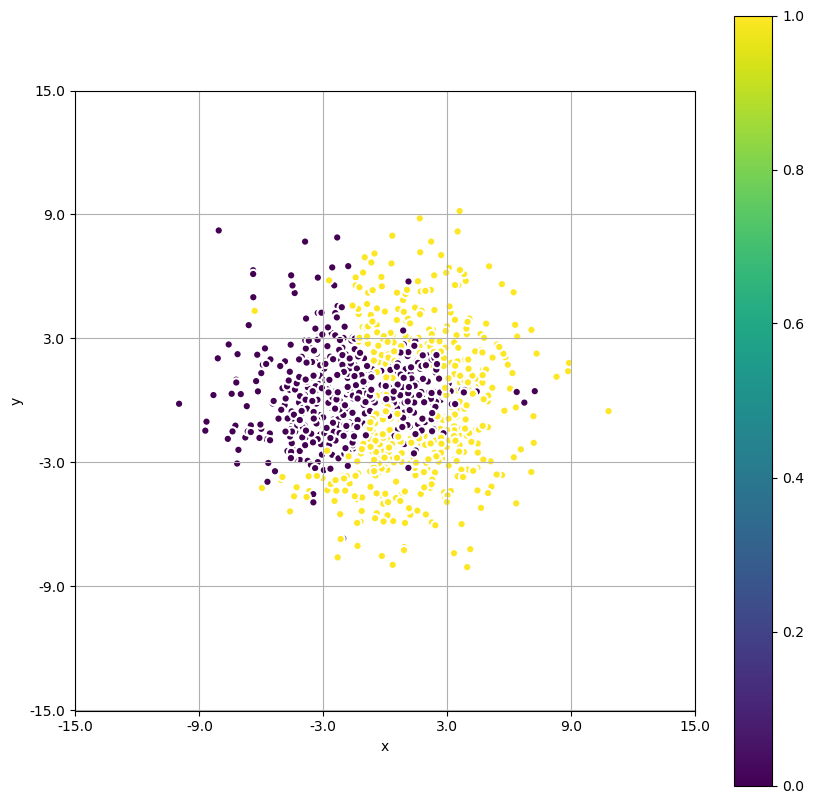

In [263]:
plot_predicts(model=Boosting(base_model_class=RandomForestRegressor, base_model_params={'n_estimators': 500}), features=X_synthetic, targets=y_synthetic)

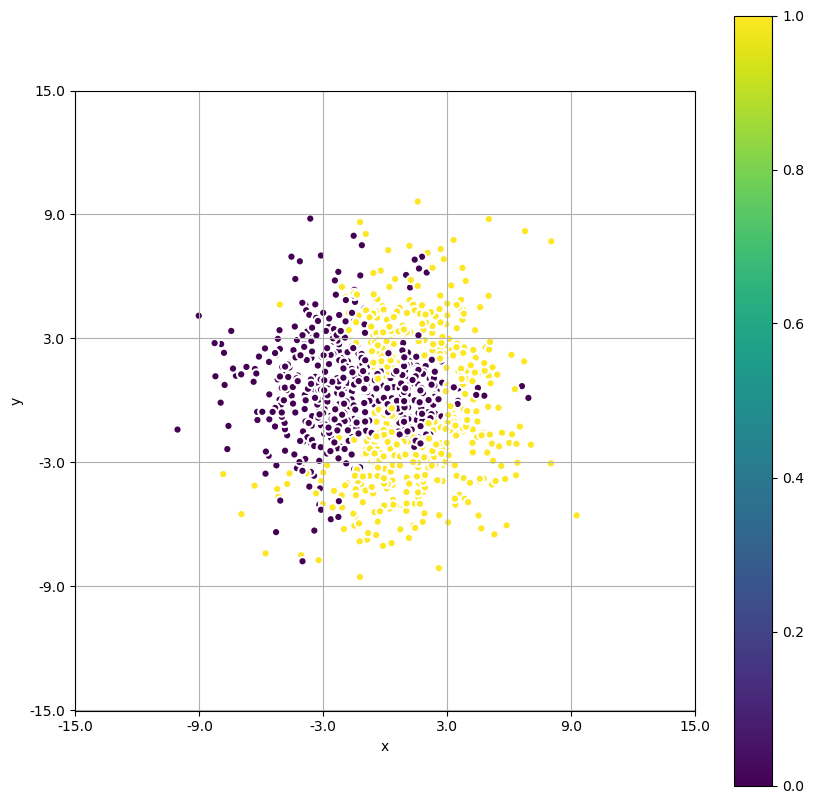

In [265]:
plot_predicts(model=Boosting(base_model_class=LinearRegression), features=X_synthetic,
             targets=y_synthetic)

**Ответ:** *Визуализация предсказаний показывает, что решающее дерево глубины 6 формирует четкие границы, но ограниченная глубина не позволяет учесть более сложные зависимости. Случайный лес создает более плавные разделяющие границы, но может переобучаться. Линейная регрессия предсказывает сглаженные границы, что делает ее менее эффективной в случае сложных данных.*

### **Задание 3. (0.8 балла) Сравнение с бустингами**

- Сравните на реальных данных данных любую из трёх популярных имплементаций градиентного бустинга (xgboost, lightgbm, catboost) с вашей реализацией.
- Укажите, получилось ли у вас победить библиотечные реализации на тестовых данных?

**Примечание:**

Подберите основные гиперпараметры (число деревьев, длина шага, глубина дерева/число листьев) для обоих методов.


**Подбор параметров для XGBoost**

In [315]:
import optuna
from xgboost import XGBClassifier

def objective(trial):
    
    learning_rate = trial.suggest_float('learning_rate', 0.01, 0.1) 
    n_estimators = trial.suggest_int('n_estimators', 100, 1000)
    max_depth = trial.suggest_int('max_depth', 3, 10) 
    min_child_weight = trial.suggest_int('min_child_weight', 1, 10)
    subsample = trial.suggest_float('subsample', 0.5, 1)
    colsample_bytree = trial.suggest_float('colsample_bytree', 0.5, 1)
    gamma = trial.suggest_float('gamma', 0.0, 5.0)
    lamda = trial.suggest_float('lamda', 0.0, 10.0)
    alpha = trial.suggest_float('alpha', 0.0, 10.0)
    
    model = XGBClassifier(
        learning_rate = learning_rate,
        n_estimators=n_estimators,
        max_depth=max_depth,
        min_child_weight=min_child_weight,
        subsample=subsample,
        colsample_bytree = colsample_bytree,
        gamma = gamma,
        lamda = lamda,
        alpha = alpha,
        n_jobs=-1
    )

    model.fit(df_train.select_dtypes(['int64', 'float64']).drop(columns='y').values, np.round(df_train.y.values == 1))

    y_pred = model.predict(df_test.select_dtypes(['int64', 'float64']).drop(columns='y').values)
    
    score = accuracy_score(np.round(df_test.y.values == 1), y_pred) 

    return score

study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=30) 

# Выводим лучшие параметры
print(f'Лучшие параметры: {study.best_params}')
print(f'Лучшее значение Accuracy: {study.best_value}')

[I 2025-02-15 02:45:48,830] A new study created in memory with name: no-name-7a149369-07d8-493e-a517-cbedf2e20e25
[I 2025-02-15 02:45:49,432] Trial 0 finished with value: 0.8949353448275862 and parameters: {'learning_rate': 0.0701872340180723, 'n_estimators': 634, 'max_depth': 3, 'min_child_weight': 10, 'subsample': 0.5871871369467384, 'colsample_bytree': 0.5058690499566622, 'gamma': 0.6293409154775109, 'lamda': 4.913267421667119, 'alpha': 4.9251371999482245}. Best is trial 0 with value: 0.8949353448275862.
[I 2025-02-15 02:45:50,006] Trial 1 finished with value: 0.8900862068965517 and parameters: {'learning_rate': 0.0248674194647137, 'n_estimators': 580, 'max_depth': 6, 'min_child_weight': 10, 'subsample': 0.6971815852027508, 'colsample_bytree': 0.6301580694838544, 'gamma': 4.429512110816952, 'lamda': 7.910780302857484, 'alpha': 2.7430908404460586}. Best is trial 0 with value: 0.8949353448275862.
[I 2025-02-15 02:45:50,594] Trial 2 finished with value: 0.8895474137931034 and parameter

Лучшие параметры: {'learning_rate': 0.05933214510566708, 'n_estimators': 657, 'max_depth': 7, 'min_child_weight': 2, 'subsample': 0.6998705171353541, 'colsample_bytree': 0.7656221515585411, 'gamma': 0.9818970643914983, 'lamda': 2.476903493399532, 'alpha': 6.994905461702556}
Лучшее значение Accuracy: 0.8970905172413793


**Подбор параметров кастомного бустинга**

In [319]:
def objective(trial):
    
    learning_rate = trial.suggest_float('learning_rate', 0.01, 0.1) 
    n_estimators = trial.suggest_int('n_estimators', 100, 1000)
    max_depth = trial.suggest_int('max_depth', 3, 10)
    subsample = trial.suggest_float('subsample', 0.1, 1)
    
    model = Boosting(
        learning_rate=learning_rate,
        n_estimators=n_estimators,
        subsample=subsample,
        base_model_params={'max_depth': max_depth}
    )

    model.fit(df_train.select_dtypes(['int64', 'float64']).drop(columns='y').values, df_train.y.values)

    y_pred = np.round(model.predict(df_test.select_dtypes(['int64', 'float64']).drop(columns='y').values) > 0.5)
    
    score = accuracy_score((df_test.y.values == 1), y_pred) 

    return score

study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=30) 

# Выводим лучшие параметры
print(f'Лучшие параметры: {study.best_params}')
print(f'Лучшее значение Accuracy: {study.best_value}')

[I 2025-02-15 02:46:48,723] A new study created in memory with name: no-name-389d12b9-280f-4ce6-a459-2c075cdda53d
[I 2025-02-15 02:46:58,589] Trial 0 finished with value: 0.8927801724137931 and parameters: {'learning_rate': 0.014424336076391252, 'n_estimators': 618, 'max_depth': 7, 'subsample': 0.8298948393987402}. Best is trial 0 with value: 0.8927801724137931.
[I 2025-02-15 02:47:08,913] Trial 1 finished with value: 0.8943965517241379 and parameters: {'learning_rate': 0.05303580178036362, 'n_estimators': 992, 'max_depth': 5, 'subsample': 0.3642312984071779}. Best is trial 1 with value: 0.8943965517241379.
[I 2025-02-15 02:47:21,748] Trial 2 finished with value: 0.8868534482758621 and parameters: {'learning_rate': 0.010316912675503016, 'n_estimators': 992, 'max_depth': 4, 'subsample': 0.8733582436045468}. Best is trial 1 with value: 0.8943965517241379.
[I 2025-02-15 02:47:25,392] Trial 3 finished with value: 0.8987068965517241 and parameters: {'learning_rate': 0.08214059356904112, 'n_

Лучшие параметры: {'learning_rate': 0.08214059356904112, 'n_estimators': 399, 'max_depth': 7, 'subsample': 0.12298235498582952}
Лучшее значение Accuracy: 0.8987068965517241


**Ваш ответ здесь**

- *По результатам подбора параметров кастомный бустинг показал более высокую точность, чем XGBoost. После подбора параметров для кастомного бустинга он достиг `Accuracy` равной примерно 0.899, тогда как XGBoost показал максимальное значение `Accuracy` около 0.897 на тестовых данных.*

### **Задание 4. (1 балл) Капля теории**

Теоретически, мы могли бы построить бэггинг на логистических регрессиях. Оцените целесообразность такого подхода. В ответе укажите:

- Идею бэггинга и его свойства;
- Характеристики модели логистической регресии;
- Сопоставление и вывод.


**Ответ:**

- **Бэггинг** — *это метод ансамблирования, который улучшает стабильность и точность моделей за счет уменьшения дисперсии. Он основан на обучении нескольких моделей на разных бутстрап-выборках и усреднении их предсказаний. Бэггинг наиболее эффективен для моделей с высокой дисперсией, таких как деревья решений, так как он помогает уменьшить их переобучение.*
  
- **Логистическая регрессия** — *это линейная модель, используемая для бинарной классификации. Она основывается на вероятностном подходе, используя сигмоидную функцию для предсказания вероятности принадлежности объекта к одному из классов. Логистическая регрессия обладает низкой дисперсией и высокой устойчивостью к изменениям в обучающих данных, но при этом она ограничена в способности моделировать нелинейные зависимости без дополнительных преобразований признаков.*

  
- *Поскольку бэггинг наиболее эффективен для моделей с высокой дисперсией, а логистическая регрессия изначально обладает низкой дисперсией и высокой устойчивостью к изменениям данных, применение бэггинга к логистической регрессии, скорее всего, не приведет к значительному улучшению качества предсказаний. Усреднение предсказаний нескольких логистических регрессий, обученных на разных бутстрап-выборках, не даст такого выигрыша, как в случае деревьев решений. Таким образом, бэггинг на логистических регрессиях в большинстве случаев нецелесообразен.*

## **Часть 1: Разделение изображения на семантические компоненты**

**Количество баллов:** 3

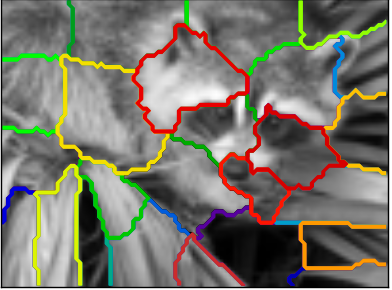

Алгоритмы кластеризации могут применяться в самых разных задачах. Например, в анализе изображений есть задача разделения изображения на семантические компоненты, которую можно решать в том числе с помощью алгоритмов кластеризации.

Проверим их на ```duck.jpg``` и ```owls.jpg```

### **Задание 5 (0.2 балла)**

Откройте изображения, после чего визуализируйте их с помощью ```plt.imshow()```

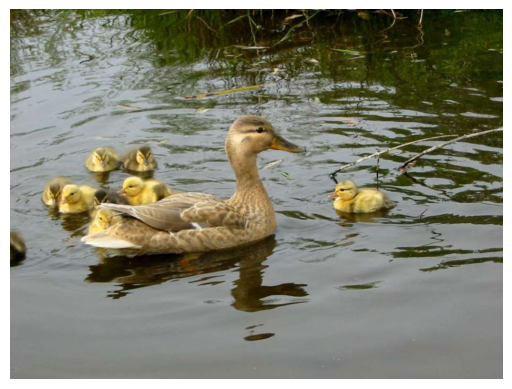

In [70]:
import matplotlib.pyplot as plt
from PIL import Image

ducks = Image.open('duck.jpg')

plt.imshow(ducks)
plt.axis('off')
plt.show()

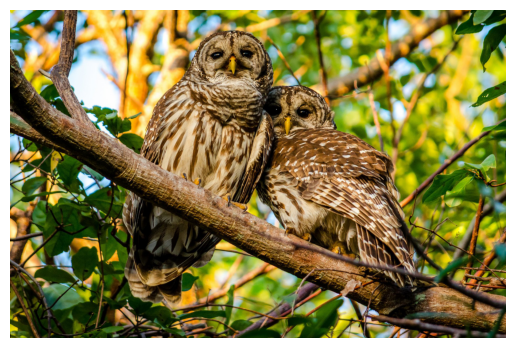

In [72]:
owls = Image.open('owls.jpg')

plt.imshow(owls)
plt.axis('off')
plt.show()

### **Задание 6 (0.8 балла)**

Для каждого изображения, используя кластеризацию ```KMeans```, выделите компоненты, охарактеризовав каждый пиксель следующим образом: $$\psi_i = [\lambda x_i, \lambda y_i, r_i, g_i, b_i]$$
 где
- $x_i$ и $y_i$ — координаты пикселя,
- $r_i, g_i, b_i$ — его цвет,
- $\lambda$ — параметр, выражающий важность пространственной связности перед цветовой похожестью.

- Примените полученную функцию, взяв следующие $\lambda$: 0.3 и 1.5 для ```duck.jpg``` и ```owls.jpg``` (или другие, но тогда с вас красивые результаты :))
- Проанализируйте результат

**Примечание:**
Число кластеров подберите разумным образом на свой вкус (в качестве нулевого приближения можно взять 3)

In [8]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from sklearn.cluster import KMeans
from skimage.segmentation import find_boundaries

def find_components(image, lmdb, n_clusters):
    image = image.convert("RGB")
    image_np = np.array(image) 

    h, w, c = image_np.shape 

    x, y = np.meshgrid(np.arange(w), np.arange(h)) 
    features = np.column_stack([
        lmdb * x.flatten(), 
        lmdb * y.flatten(),
        image_np.reshape(-1, 3) 
    ])

    kmeans = KMeans(n_clusters=n_clusters, n_init=10, random_state=42)
    labels = kmeans.fit_predict(features)
    clustered_image = kmeans.cluster_centers_[:, 2:][labels].reshape(h, w, c).astype(np.uint8)
    clustered_pil = Image.fromarray(clustered_imag

    return clustered_pil, labels.reshape(h, w)

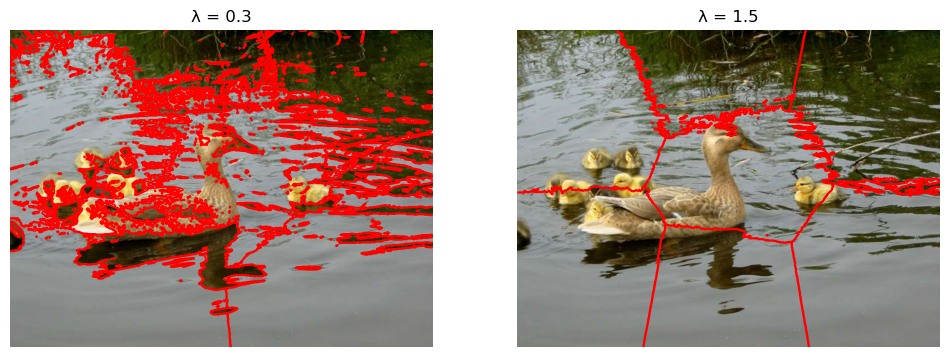

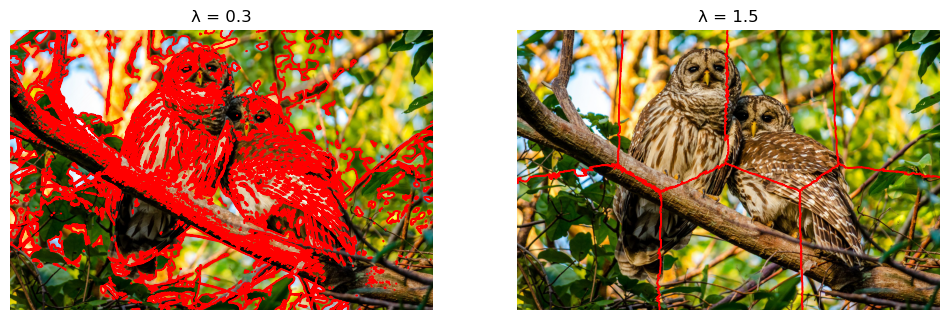

In [10]:
image_paths = ['duck.jpg', 'owls.jpg']
lmdb_values = [0.3, 1.5]
num_clusters = 7


for image_path in image_paths:
    image = Image.open(image_path)
    
    fig, axes = plt.subplots(1, len(lmdb_values), figsize=(12, 6))
    if len(lmdb_values) == 1:
        axes = [axes]
    
    for ax, lmdb in zip(axes, lmdb_values):
        clustered_img, cluster_labels = find_components(image, lmdb, num_clusters)
        boundaries = find_boundaries(cluster_labels, mode='thick')
        
        ax.imshow(image)
        ax.contour(boundaries, colors='red', linewidths=1)
        ax.set_title(f"λ = {lmdb}")
        ax.axis('off')
    
    plt.show()

**Ваш ответ здесь**

- *Низкое значение Лямбда делает сегментацию более чувствительной к цвету, а высокое значение приводит к формированию более крупных и связанных областей. Оптимальный выбор параметра зависит от задачи. Если требуется детализированное выделение объектов, предпочтительно использовать низкие значения, а если важны крупные сегменты, лучше подойдет более высокое.*

### **Задание 7 (0.8 балла)**

Попробуйте выделить сегменты при помощи [спектральной кластеризации](http://scikit-learn.org/stable/modules/clustering.html#spectral-clustering). Обратите внимание на [пример в sklearn](http://scikit-learn.org/0.16/auto_examples/cluster/plot_lena_segmentation.html).


**Примечание:**

Для ускорения работы алгоритма рекомендуется привести изображение к серому цвету. При необходимости можно сжать изображения в 2 раза.

**Подсказка:**```skimage``` с его ```color``` и ```transform``` в этом помогут :)

Или же воспользуйтесь аналогичными средствами ```PIL``` или ```cv2```

In [32]:
def spectral_segmentation(pil_image, n_clusters=5, beta=5, eps=1e-6):

    gray_full = color.rgb2gray(np.array(pil_image))
    original_shape = gray_full.shape

    small_gray = transform.resize(
        gray_full, 
        (original_shape[0] // 4, original_shape[1] // 4),#уменьшил размер в 4 раза, так как уменьшение в 2 раза слишком долго работало
        anti_aliasing=True)

    graph = skimage_image.img_to_graph(small_gray)
    graph.data = np.exp(-beta * graph.data / small_gray.std()) + eps

    labels_small = spectral_clustering(
        graph,
        n_clusters=n_clusters,
        assign_labels='kmeans',
        random_state=42)
    
    labels_small = labels_small.reshape(small_gray.shape)
    labels_resized = transform.resize(
        labels_small, 
        original_shape,
        order=0,
        preserve_range=True,
        anti_aliasing=False
    )
    labels_full = labels_resized.astype(np.int32)
    
    return labels_full

### **Задание 8 (0.2 балла)**
- Визуализируйте результаты сегментации (аналогично рисунку в начале задания 2) для обоих методов.
- Проанализируйте сравнение

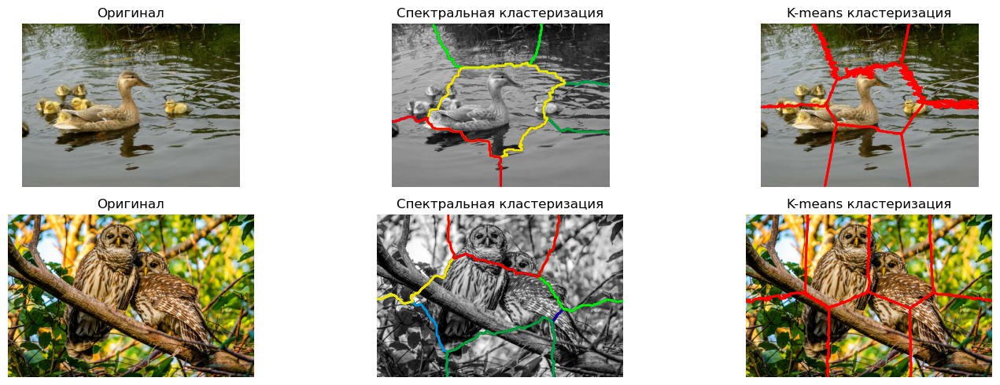

In [68]:
n_clusters = 7

fig, axes = plt.subplots(2, 3, figsize=(15, 5))

for i, j in enumerate(['duck.jpg', 'owls.jpg']):
    pil_img = Image.open(j)
    labels_spectral = spectral_segmentation(pil_img, n_clusters=n_clusters, beta=4, eps=1e-6)
    gray_img = color.rgb2gray(np.array(pil_img))
    clustered_pil, labels_kmeans = find_components(pil_img, lmdb=1.6, n_clusters=n_clusters)
    axes[i, 0].imshow(pil_img)
    axes[i, 0].set_title('Оригинал')
    axes[i, 0].axis('off')

    axes[i, 1].imshow(gray_img, cmap='gray')
    for cluster_val in range(n_clusters):
        axes[i, 1].contour(
            (labels_spectral == cluster_val).astype(float),
            levels=[0.5],
            colors=[plt.cm.nipy_spectral(cluster_val / float(n_clusters))],
            linewidths=2)
    axes[i, 1].set_title('Спектральная кластеризация')
    axes[i, 1].axis('off')
    axes[i, 2].imshow(pil_img)  
    for cluster_val in range(n_clusters):
        axes[i, 2].contour(
            (labels_kmeans == cluster_val).astype(float),
            levels=[0.5],
            colors=['red'],
            linewidths=2)
    axes[i, 2].set_title('K-means кластеризация')
    axes[i, 2].axis('off')

plt.tight_layout()
plt.show()

**Ваш ответ здесь**

- *Спектральная кластеризация выделяет более гладкие и естественные границы объектов, так как учитывает топологические связи между пикселями. В изображениях уток и сов она обеспечивает более четкое разделение, особенно на текстурных областях. K-Means же более чувствителен к цветовым различиям, создавая четкие, но иногда искусственные границы. В некоторых случаях он менее точен в выделении объектов, так как не учитывает пространственную связанность. Визуально спектральная кластеризация лучше сохраняет структуру объектов, тогда как K-Means дает более жесткие разбиения.*

### **Задание 9 (1 балл)**

- Найдите интересную картинку милого животного и примените алгоритмы и к ней. Поэкспериментируйте с параметрами алгоритмов и постарайтесь добиться оптимального результата. Картинку нужно будет загрузить вместе с работой.

- Сравните два подхода и сегментации, к которым они приводят. Для всех ли изображений в результате сегментации хорошо видны контуры объектов?

**Примечание:**

Слишком большие лучше не брать - считаться будет долго. Не забудьте визуализировать!


Я для разнообразия решил взять свою собаку, а не кота для экспериментов. Перед этим я сжал дважды фото до размера 323x430.

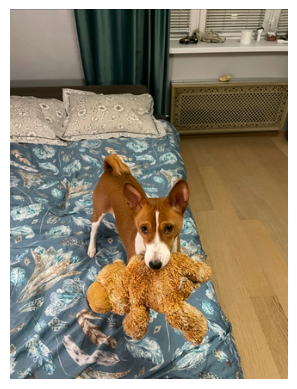

In [75]:
roka = Image.open('My_dog.jpg')

plt.imshow(roka)
plt.axis('off')
plt.show()

**K-Means**

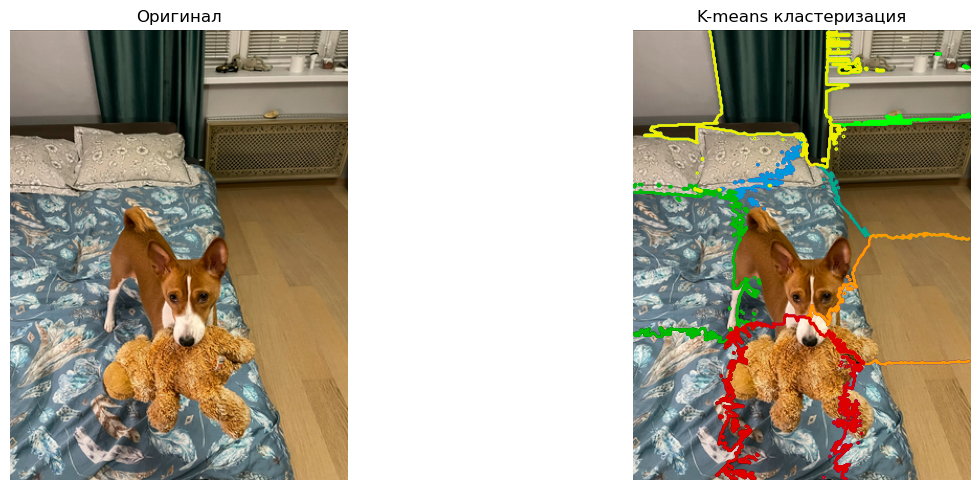

In [220]:
n_clusters = 10

clustered_pil, labels_kmeans = find_components(roka, lmdb=1.8, n_clusters=n_clusters)

fig, axes = plt.subplots(1, 2, figsize=(15, 5))

axes[0].imshow(roka)
axes[0].set_title('Оригинал')
axes[0].axis('off')

axes[1].imshow(roka)  
for cluster_val in range(n_clusters):
    axes[1].contour(
        (labels_kmeans == cluster_val).astype(float),
        levels=[0.5],
        colors=[plt.cm.nipy_spectral(cluster_val / float(n_clusters))],
        linewidths=2)
axes[1].set_title('K-means кластеризация')
axes[1].axis('off')

plt.tight_layout()
plt.show()


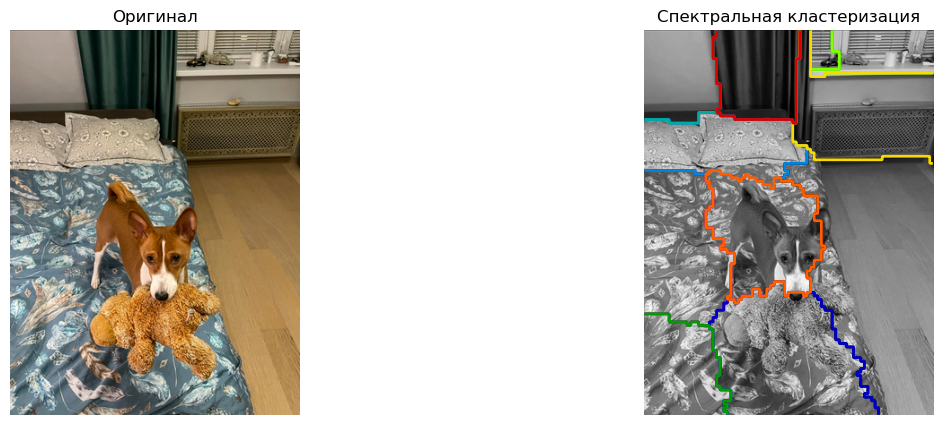

In [240]:
n_clusters = 11

labels_spectral = spectral_segmentation(roka, n_clusters=n_clusters, beta=6, eps=0.000007)
gray_img = color.rgb2gray(np.array(roka))

fig, axes = plt.subplots(1, 2, figsize=(15, 5))

axes[0].imshow(roka)
axes[0].set_title('Оригинал')
axes[0].axis('off')

axes[1].imshow(gray_img, cmap='gray')
for cluster_val in range(n_clusters):
    axes[1].contour(
        (labels_spectral == cluster_val).astype(float),
        levels=[0.5],
        colors=[plt.cm.nipy_spectral(cluster_val / float(n_clusters))],
        linewidths=2)
    axes[1].set_title('Спектральная кластеризация')
    axes[1].axis('off')

**Ваш ответ здесь**

## **Бонус (1 балл)**

В качестве бонуса предлагаем вам построить алгоритм кластеризации типов движения на наборе Samsung Human Activity Recognition. Набор данных заранее предобработан и снова доступен вам по [ссылке](https://drive.google.com/file/d/16ISu7lMumt5rbticbOggHMRjwTGBETtO/view?usp=sharing).

### **Постановка задачи**
Данные поступают с акселерометров и гироскопов мобильных телефонов Samsung Galaxy S2. Вид активности человека с телефоном в кармане известен:
- 1 - ходьба,
- 2 - подъем вверх по лестнице,
- 3 - спуск по лестнице,
- 4 - сидение,
- 5 - стояние,
- 6 - лежание


Представим, что вид активности нам неизвестнен, и попробуем кластеризовать людей чисто на основе имеющихся признаков.

### **Задание 1 (0.05 балла)**
Прочитайте данные из файлов и объедните тестовую и обучающие выборки.

В файлах ```..._labels``` лежат настоящие классы. Их также объедините, но в отдельную переменную (например ```y```). Данный вектор для кластеризации нам не нужен, но мы будем смотреть по нему метрики.

In [ ]:
# Ваш код здесь
X =
y =

In [ ]:
# убедимся, что y содержит нужные нам классы
np.unique(y)

### **Задание 2 (0.05 балла)**

Так как мы будем пользоваться метрическими алгоритмами, отмасштабируйте выборку с помощью ```StandardScaler```.

In [ ]:
# Ваш код здесь
scaler =
X_scaled =

### **Задание 3 (0.15 балла)**

Данных много и размерность большая. Чтобы ускорить рещение задачи с точки зрения построения модели, мспользуем методы **понижения размерности**. В частности, мы будем использовать метод главных компонент. Если вы проходили степик, то знакомы с ним, если нет, то почитать про PCA вам нужно в [Конспекте](https://github.com/esokolov/ml-course-hse/blob/master/2020-fall/lecture-notes/lecture12-factorizations.pdf).

- Понизьте размерность с помощью `PCA`, оставляя столько компонент, сколько нужно для того, чтобы объяснить как минимум 90% дисперсии отмасштабированных данных. Вам пригодится [документация](https://scikit-learn.org/stable/modules/generated/sklearn.decomposition.PCA.html)

**Примечание:**
Для этого сумма массива pca.explained_variance_ratio_ должна быть больше 0.9.  ```random_state``` используйте из объявленной в самом начале переменной ```RANDOM_STATE``` (42).

In [ ]:
# Ваш код здесь
plt.scatter()

### **Задание 4. (0.15 балла)**

Разберёмся с `KMeans`, [doc](https://scikit-learn.org/stable/modules/generated/sklearn.cluster.KMeans.html)

- Сделайте кластеризацию данных методом `KMeans`, обучив модель на данных со сниженной за счет `PCA` размерностью. Нужно искать 6 кластеров (изначально у нас 6 классов). Засеките время обучения и время инференса.

**Параметры обучения:**

```n_clusters = 6``` (число уникальных меток целевого класса = 6)

```n_init = 100```

```random_state = RANDOM_STATE``` (для воспроизводимости результата, не забывайте указывать его и дальше!)

In [ ]:
# Ваш код здесь

### **Задание 6 (0.05 балла)**

- Визуализируйте данные в проекции на первые две главные компоненты.
- Раскрасьте точки в соответствии с полученными метками кластеров.

In [ ]:
# Ваш код здесь

### **Задание 7 (0.1 балла)**

- Выберите какие-то метрики (минимум две) из известных вам. Объясните свой выбор
- Выведите на экран значения метрик качества, сделайте вывод о них и используйте их далее.

In [ ]:
# Ваш код здесь

**Ваш ответ здесь.**

### **Задание 8 (0.15 баллов)**

Теперь попробуем сделать кластеризацию с помощью `AgglomerativeClustering`, [doc](https://scikit-learn.org/stable/modules/generated/sklearn.cluster.AgglomerativeClustering.html)

- Засеките время обучения и время инференса. После кластеризации также:
  - Вновь визуализируйте данные с раскраской по полученным меткам
  - Выведите метрики. Засеките время обучения и время инференса. Сравните с ```KMeans```.

Ответьте на следующие вопросы:
* Стало ли лучше?
* Почему?

In [ ]:
# Ваш код здесь

**Ваш ответ здесь.**

### **Задание 9 (0.3 балла)**
Для самой успешной из полученных кластеризаций попробуйте дать интерпретацию кластеров. Опишите характеристики объектов, попавших в каждый кластер. Для этого можете ответить на следующие вопросы:

* Похожи ли объекты внутри каждого кластера на определенный тип активности человека?
* В каких кластерах смешано несколько типов активности? С чем, на ваш взгляд, это может быть связано?
* Качественная ли получилась кластеризация? На основании чего вы можете сделать такой вывод?

**Ваш ответ здесь.**

**Вы ещё здесь!** или **уже**?)

Спасибо за труд! Котобонус:

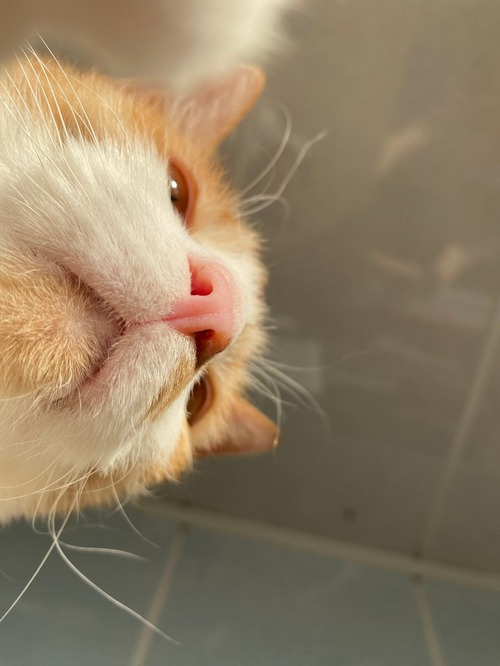